In [1]:
import pygmt 
import pandas as pd

# Load in your data
orig_topo = ("/Users/leahapril/Documents/texas_project/topo_texas.grd") 
stations_df = pd.read_excel('/Users/leahapril/Documents/texas_project/Iglesias-Coordinates.xlsx')

In [2]:
stations_df.tail()

,Name,SN,Station,Latitude,Longitude,Elevation,Northing,Easting
45,Our Lady of Assumption,1235,146,31.81952,-106.45260,1232,362519.49,3521349.73
46,House 3,1206,147,31.85700,-106.54500,1256,353832.55,3525625.70
47,House 4,1165,148,31.75050,-106.28951,1220,377865.58,3513504.34
48,Our Lady of Guadalupe (Northeast),1151,149,31.80118,-106.46692,1229,361136.93,3519335.58
49,House 5,1187,150,31.77900,-106.24025,1216,382567.52,3516609.35


In [3]:
import pygmt
import pandas as pd
# load in data of the earthquakes in the region in the time frame
earthquakes_df = pd.read_csv('/Users/leahapril/Documents/texas_project/earthquakes.csv')

In [4]:
earthquakes_df.tail()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
65,2021-06-12T13:31:11.531Z,31.626329,-104.135132,6.825684,2.0,ml,16.0,57,0.114780,0.3,...,2021-06-14T16:24:24.704Z,"47 km NW of Toyah, Texas",earthquake,1.104814,1.430987,0.1,6,reviewed,tx,tx
66,2021-06-13T09:38:29.773Z,31.616837,-104.097952,6.671436,2.0,ml,20.0,69,0.090222,0.2,...,2021-06-14T15:21:34.748Z,"44 km NW of Toyah, Texas",earthquake,0.969801,1.210526,0.1,9,reviewed,tx,tx
67,2021-06-14T02:59:34.794Z,28.514099,-98.645335,2.518840,2.0,ml,15.0,73,0.209010,0.3,...,2021-06-14T18:04:27.269Z,"11 km WNW of Tilden, Texas",earthquake,1.676562,2.002398,0.1,10,reviewed,tx,tx
68,2021-06-14T05:00:29.901Z,31.674868,-104.415900,6.877100,2.0,ml,19.0,56,0.072624,0.3,...,2021-06-14T18:18:21.036Z,"55 km S of Whites City, New Mexico",earthquake,1.109603,1.367509,0.2,9,reviewed,tx,tx
69,2021-06-14T12:44:04.720Z,32.119446,-102.172852,7.409790,2.0,ml,23.0,62,0.011432,0.1,...,2021-06-14T16:10:28.158Z,"16 km NNW of Midland, Texas",earthquake,0.693502,0.772134,0.2,13,reviewed,tx,tx


In [5]:
# Set the region for the plot to be slightly larger than the data bounds.
region = [
    stations_df.Longitude.min() - .4,
    stations_df.Longitude.max() + 2,
    stations_df.Latitude.min() - 1,
    stations_df.Latitude.max() + 1,
]

print(region)

[-106.98278, -104.15928, 30.50367, 32.92143]


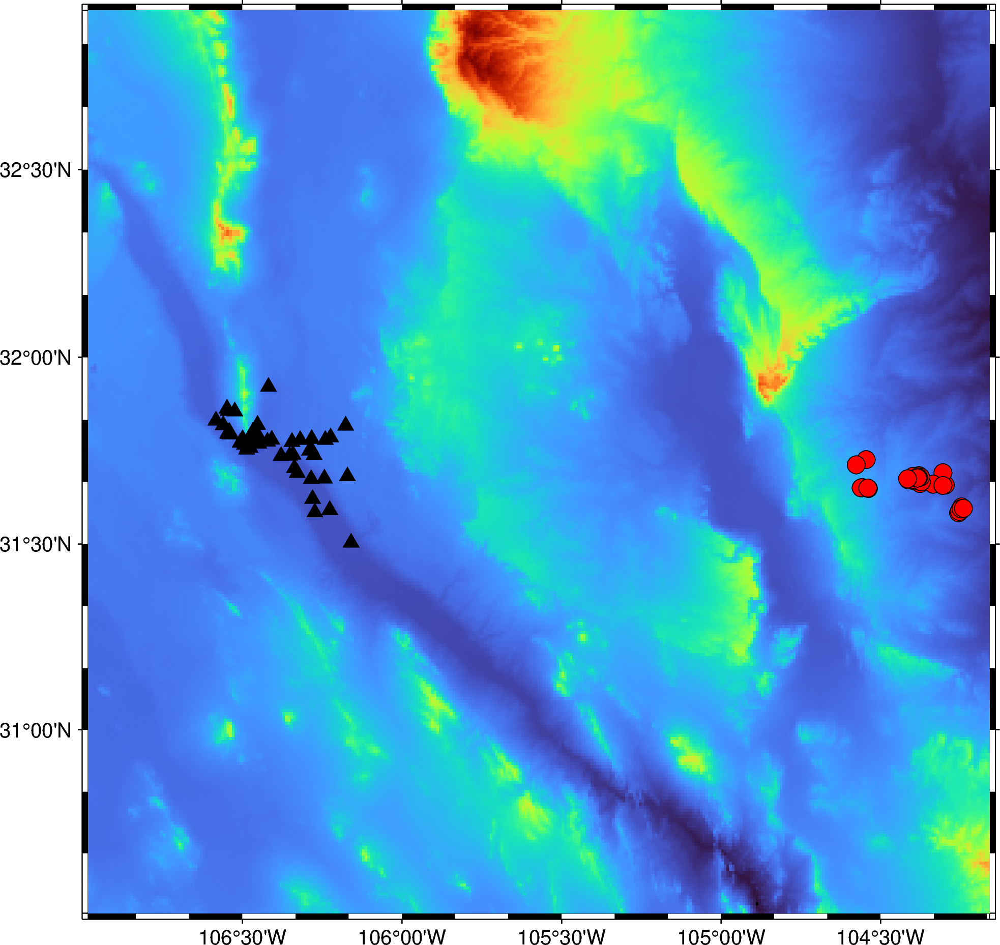

In [6]:
# plotting map of stations and close proximity earthquakes
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="yellow", water="skyblue")
fig.grdimage(grid=orig_topo)
fig.plot(x=stations_df.Longitude, y=stations_df.Latitude, style="t0.3c", fill="black", pen="black")
fig.plot(x=earthquakes_df.longitude, y=earthquakes_df.latitude, style="c0.3c", fill="red", pen="black")
fig.show()

In [7]:
# setting new region to get better understanding of the world earthquakes that occured in desired region
region2 = [
    earthquakes_df.longitude.min() - 1.5,
    earthquakes_df.longitude.max() + 2,
    earthquakes_df.latitude.min() - 1.5,
    earthquakes_df.latitude.max() + .25,
]

print(region2)


[-106.6732, -93.36116667, 26.8778, 36.78466667]


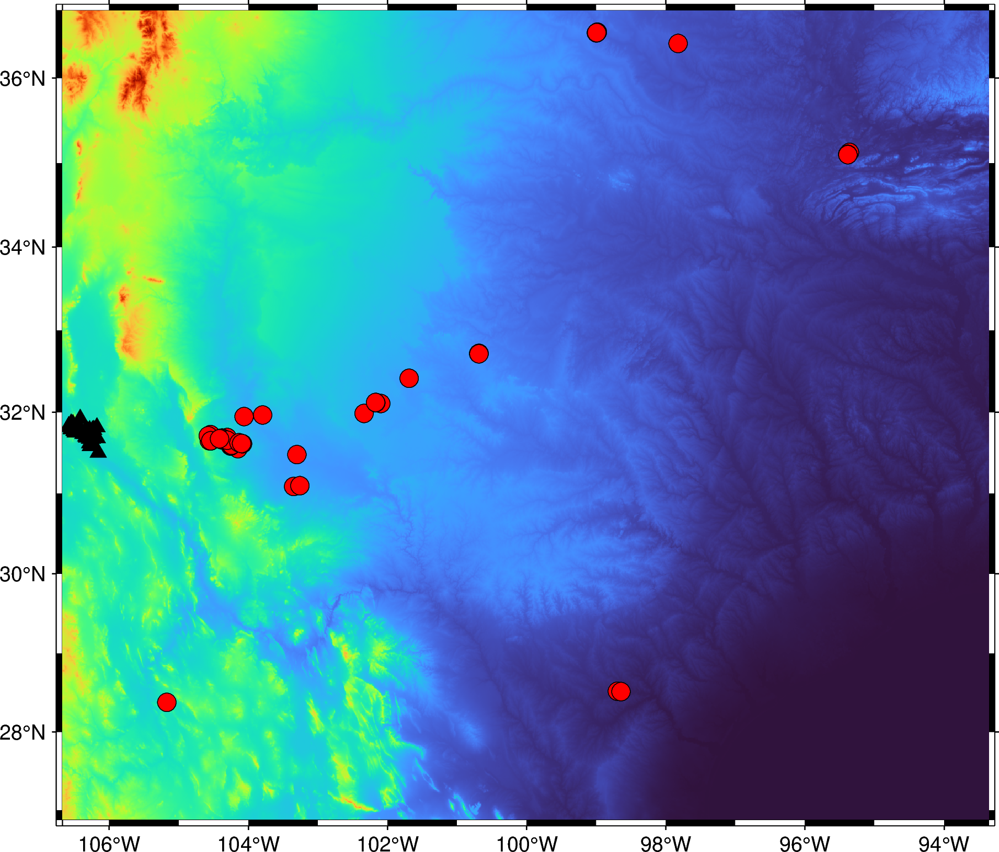

In [8]:
# plotting map of stations and world earthquakes that occured in desired region (zoomed out)
fig = pygmt.Figure()
fig.basemap(region=region2, projection="M15c", frame=True)
fig.coast(land="yellow", water="skyblue")
fig.grdimage(grid=orig_topo)
fig.plot(x=stations_df.Longitude, y=stations_df.Latitude, style="t0.3c", fill="black", pen="black")
fig.plot(x=earthquakes_df.longitude, y=earthquakes_df.latitude, style="c0.3c", fill="red", pen="black")
fig.show()

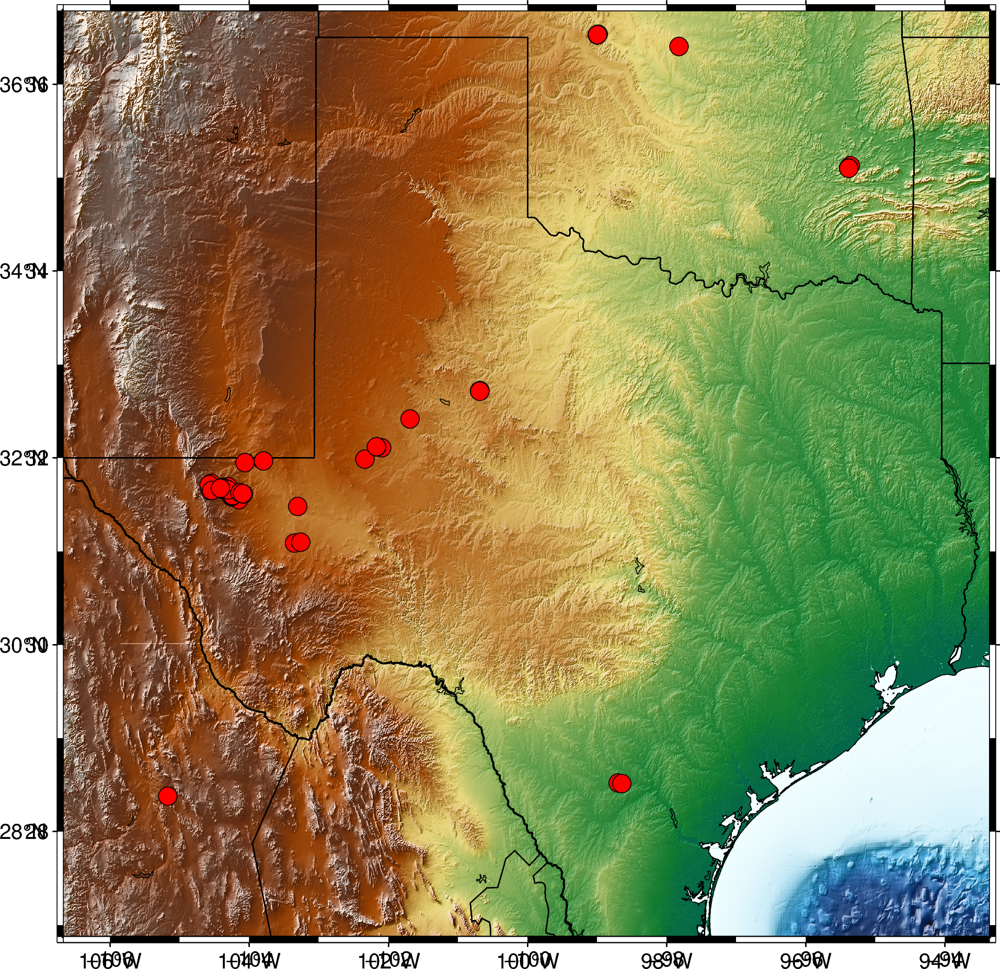

In [10]:
# plotting new map to only show the world eathquakes that occured in desired region
topo_data = '@earth_relief_15s'
fig = pygmt.Figure()
fig.basemap(region=region2)
fig.grdimage(topo_data, shading=True)
fig.coast(shorelines=True, frame=True, borders=["1/0.8p,black", "2/0.5p,black", "3/0.5p,black"])
fig.plot(x=earthquakes_df.longitude, y=earthquakes_df.latitude, style="c0.3c", fill="red", pen="black")
fig.show()